In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
import seaborn as sns; sns.set()
from sklearn.linear_model import SGDClassifier 
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import *
import time

%matplotlib inline

In [2]:
cd data

In [2]:
#This loop only using all the possible data
df = pd.read_csv('final_data.csv')

In [3]:
df["booking_date"].max()

'2016-04-30 00:00:00'

In [4]:
df.shape

(24855, 27)

In [5]:
acs =pd.read_csv('fips_acs.csv')

In [6]:
acs.columns

Index(['zip', 'latitude', 'longitude', 'fips', 'per_capita_income',
       'poverty_stat', 'household_income', 'mortgage_stat',
       'school_enrollment_16-19', 'own_children_under18', 'SSI_income',
       'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income'],
      dtype='object')

In [7]:
df.zip.nunique()

1208

In [8]:
#updated acs file almost have all the zips we need
acs.zip.nunique()

1110

In [9]:
acs=acs.drop(columns=['latitude', 'longitude', 'fips'])

In [10]:
df=df.dropna(subset=['zip'])

In [11]:
df = acs.merge(df, how="inner")

In [12]:
df=df.drop_duplicates()

In [13]:
df.shape

(24433, 40)

In [14]:
df.columns

Index(['zip', 'per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income',
       'mni_no', 'dedupe_id', 'dob', 'sex', 'race', 'mar_stat', 'city',
       'state', 'case_no', 'case_type', 'booking_no', 'arresting_agency',
       'arresting_agency_type', 'booking_date', 'release_date', 'bail_type',
       'bail_amt', 'bailed_out', 'pri_dx_value', 'refferal_source',
       'mh_treatment', 're_entry', 'age', 'after_released', 'within_one',
       'within_two'],
      dtype='object')

In [15]:
#Check the prob of re-entry within one year
df['within_one'].sum()/df.shape[0]

0.21966193263209594

In [16]:
#Check the prob of re-entry within two year
df['within_two'].sum()/df.shape[0]

0.2725821634674416

In [17]:
df = df.drop(['re_entry', 'mni_no', 'dedupe_id', 'dob', 'state', 'city',  'zip', 'release_date', 'case_no', 'booking_no', 'pri_dx_value',
       'refferal_source'], axis=1)

In [18]:
df.columns

Index(['per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income',
       'sex', 'race', 'mar_stat', 'case_type', 'arresting_agency',
       'arresting_agency_type', 'booking_date', 'bail_type', 'bail_amt',
       'bailed_out', 'mh_treatment', 'age', 'after_released', 'within_one',
       'within_two'],
      dtype='object')

In [19]:
df.head()

,per_capita_income,poverty_stat,household_income,mortgage_stat,school_enrollment_16-19,own_children_under18,SSI_income,grandparent_care,military_service,education_25,...,arresting_agency_type,booking_date,bail_type,bail_amt,bailed_out,mh_treatment,age,after_released,within_one,within_two
0,29721.0,1177,407,371,59,327,407,706,91,773,...,COUNTY SHERIFF,2011-11-20 00:00:00,SUR,NaN,0,0,22.0,138.0,1,1
1,29721.0,1177,407,371,59,327,407,706,91,773,...,CITY,2014-05-02 00:00:00,SUR,1500.0,1,0,24.0,557.0,0,1
2,29721.0,1177,407,371,59,327,407,706,91,773,...,COUNTY SHERIFF,2014-12-03 00:00:00,SUR,5000.0,1,0,24.0,198.0,1,1
3,29721.0,1177,407,371,59,327,407,706,91,773,...,CITY,2015-05-22 00:00:00,PR,2500.0,1,0,27.0,1199.0,0,0
4,29721.0,1177,407,371,59,327,407,706,91,773,...,COUNTY SHERIFF,2016-03-30 00:00:00,SUR,NaN,0,0,NaN,914.0,0,0


In [20]:
dummy_vals = ['sex', 'race','mar_stat', 'case_type', 'arresting_agency', 'arresting_agency_type', 'bail_type' ]

In [21]:
#generate dummy variable for specific column
def getting_dummy(df, col):
    '''
    Helper function to create dummy variables in dataframe for specific column
    This function will return dataframe
    '''
    dummies = pd.get_dummies(df[col]).rename(columns=lambda x: str(col)+ str(x))
    df = pd.concat([df, dummies], axis=1)
    df.drop([col], inplace=True, axis=1)
    return df

In [22]:
for dummy in dummy_vals:
    df = getting_dummy(df, dummy)

In [23]:
#4 GenerateFeatures/Predictors: discretize a continuous variable 
def discrete_val(df, cols, bins=4):
    '''
    Helper function to discrete the continueous variable in dataframe into 4 bins
    This function will return dictionary mapping column name to the bin values
    '''
    for col in cols:
        new = col+'_binned'
        df[new] = pd.cut(df[col], bins, include_lowest=True, labels = range(0,bins))
        df.drop([col], inplace=True, axis=1)
    return df

In [24]:
binv = ['age', 'per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income','bail_amt']
df = discrete_val(df, binv, 6)

In [25]:
dum = [ 'age_binned','per_capita_income_binned',
 'poverty_stat_binned',
 'household_income_binned',
 'mortgage_stat_binned',
 'school_enrollment_16-19_binned',
 'own_children_under18_binned',
 'SSI_income_binned',
 'grandparent_care_binned',
 'military_service_binned',
 'education_25_binned',
 'property_value_occupied_binned',
 'retirement_income_binned',
 'rent_over_income_binned',
 'bail_amt_binned']

In [26]:
for dummy in dum:
    df = getting_dummy(df, dummy)

In [27]:
indepv = list(df.columns)

In [28]:
indepv.remove('after_released')

In [29]:
indepv.remove('within_one')

In [30]:
indepv.remove('within_two')

In [31]:
indepv

['booking_date',
 'bailed_out',
 'mh_treatment',
 'sexFEMALE',
 'sexMALE',
 'sexmissing',
 'raceAMERICAN INDIAN OR ALASKA NATIVE',
 'raceASIAN',
 'raceBLACK OR AFRICAN AMERICAN',
 'raceWHITE',
 'mar_statA',
 'mar_statD',
 'mar_statM',
 'mar_statN',
 'mar_statS',
 'mar_statU',
 'mar_statW',
 'mar_statY',
 'mar_statmissing',
 'case_typeCR',
 'case_typeDV',
 'case_typeJV',
 'arresting_agencyFAIRWAY P.D.',
 'arresting_agencyGARDNER P.D.',
 'arresting_agencyJOHNSON COUNTY PARK PATROL',
 "arresting_agencyJOHNSON COUNTY SHERIFF'S DEPARTMENT",
 'arresting_agencyKANSAS HIGHWAY PATROL',
 'arresting_agencyLAKE QUIVIRA P.D.',
 'arresting_agencyLEAWOOD P.D.',
 'arresting_agencyLENEXA P.D.',
 'arresting_agencyMERRIAM P.D.',
 'arresting_agencyMISSION P.D.',
 'arresting_agencyOLATHE P.D.',
 'arresting_agencyOTHER AGENCY',
 'arresting_agencyOVERLAND PARK P.D.',
 'arresting_agencyPRAIRIE VILLAGE P.D.',
 'arresting_agencyROELAND PARK P.D.',
 'arresting_agencySHAWNEE MISSION SCHOOL SECURITY',
 'arresting_

In [32]:
def temporal_split(df, time_col, start_time, mid_time, end_time):
    train = df[(df[time_col] >= start_time) & (df[time_col] < mid_time) ]
    test = df[(df[time_col] >= mid_time)  & (df[time_col] < end_time)]
    train = train.drop([time_col], axis=1)
    test = test.drop([time_col], axis=1)
    return train, test

In [33]:
indepv.remove('booking_date')

In [34]:
def split_data(train, test, y):
    '''
    Split the data into training and testing set
    
    And save them to run try different models
    '''
    x_test = test[indepv] 
    x_train = train[indepv]
    y_test = test[y]
    y_train = train[y]
    
    return x_train, x_test, y_train, y_test

In [35]:
train, test = temporal_split(df, 'booking_date', '2010-01-01', '2015-07-01', '2018-01-01' )

In [36]:
train.shape

(20783, 144)

In [37]:
test.shape

(3650, 144)

In [38]:
clfs = {'RF': RandomForestClassifier(),
    'Boost': AdaBoostClassifier(DecisionTreeClassifier(max_depth=1)),
    'Logit': LogisticRegression(),
    'SVM': SVC(probability=True, random_state=0),
    'Tree': DecisionTreeClassifier(),
    'Bag': BaggingClassifier(),
    'KNN': KNeighborsClassifier(),
    'ET': ExtraTreesClassifier(n_estimators=10, n_jobs=-1, criterion='entropy'),
    'NB': GaussianNB()}

small_grid = {'RF':{'n_estimators': [10,100], 'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10]},
    'Boost': {'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [1,10,100,1000]},
    'Logit': {'penalty': ['l1','l2'], 'C': [0.001,0.01,0.1,1,10]},
    'SVM' :{'C' :[0.01,0.1,1,10],'kernel':['linear']},
    'Tree': {'criterion': ['gini', 'entropy'], 'max_depth': [5,10,20,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,5]},
    'Bag':{'n_estimators':[1,10,20,50], 'max_samples':[5,10], 'max_features': [5,10]},
    'KNN' :{'n_neighbors': [1,10,50],'weights': ['uniform','distance'],'algorithm': ['auto']},
    'ET': {'n_estimators': [10,100], 'criterion' : ['gini', 'entropy'] ,'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10], 'n_jobs': [-1]},
    'NB' : {}}

In [39]:
def generate_binary_at_k(y_scores, k):
    '''
    Set first k% as 1, the rest as 0.
    '''
    cutoff_index = int(len(y_scores) * (k / 100.0))
    test_predictions_binary = [1 if x < cutoff_index else 0 for x in range(len(y_scores))]
    return test_predictions_binary

In [40]:
def scores_at_k(y_true, y_scores, k):
    '''
    For a given level of k, calculate corresponding
    precision, recall, and f1 scores.
    '''
    preds_at_k = generate_binary_at_k(y_scores, k)
    precision = round(precision_score(y_true, preds_at_k),4)
    recall = round(recall_score(y_true, preds_at_k), 4)
    f1 = round(f1_score(y_true, preds_at_k),4)
    return precision, recall, f1

In [41]:
def plot(y_test, y_pred_probs, model, para = None):

    precision, recall, _ = precision_recall_curve(y_test, y_pred_probs)
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve for {} model: AUC={:.2f} \n with parameters: {}'.\
                        format(model, average_precision_score(y_test, y_pred_probs), para))
    plt.show()

In [42]:
def clf_loop(models, x_train, x_test, y_train, y_test, grid=small_grid):
    '''
    Run model with given params on x and y
    and print out the scores for comparison
    '''
    results_df = pd.DataFrame(columns=('model_type', 'parameters', 'auc-roc', 'precision', 'time', 'precision,recall,f1 at_5',
     'precision,recall,f1 at_10', 'precision,recall,f1 at_20', 'precision,recall,f1 at_30', 'precision,recall,f1 at_50'))
    for index, clf in enumerate([clfs[x] for x in models]):
        model_params = grid[models[index]]
        for p in ParameterGrid(model_params):
            try:
                start = time.time()
                clf.set_params(**p)
                y_pred_probs = clf.fit(x_train, y_train).predict_proba(x_test)[:,1]
                accuracy = clf.score(x_test, y_test)
                end = time.time()
                #Zip, unzip to ensure corresponding order
                y_pred_probs_sorted, y_test_sorted = zip(*sorted(zip(y_pred_probs, y_test), reverse=True))

                results_df.loc[len(results_df)] = [models[index], p,
                                             round(roc_auc_score(y_test, y_pred_probs),4),
                                             round(average_precision_score(y_test, y_pred_probs),4),
                                             round(end-start, 4) ,                                                    
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,5.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,10.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,20.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,30.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,50.0)]

                #plot(y_test, y_pred_probs, models[index],p)
                
            except IndexError as e:
                print(e)
                continue
    return results_df

In [43]:
#Running classifiers to predict if the person re-enter within one years
x_train, x_test, y_train, y_test = split_data(train, test, 'within_one')

In [44]:
x_train, x_test, y_train2, y_test2 = split_data(train, test, 'within_two')

In [45]:
results = clf_loop(["RF", "Boost", "Bag", "Logit", "KNN", "Tree", "ET", "NB"], x_train, x_test, y_train, y_test)

In [46]:
from IPython.display import display
display(results.head(10))

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
0,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7437,0.4117,0.1264,"(0.5165, 0.1289, 0.2064)","(0.4877, 0.2442, 0.3254)","(0.4452, 0.4458, 0.4455)","(0.4018, 0.6036, 0.4825)","(0.3129, 0.7833, 0.4471)"
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7461,0.4146,0.7538,"(0.489, 0.1221, 0.1954)","(0.4795, 0.2401, 0.3199)","(0.4438, 0.4444, 0.4441)","(0.3863, 0.5802, 0.4638)","(0.3134, 0.7846, 0.4479)"
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7255,0.3948,0.0793,"(0.5, 0.1248, 0.1998)","(0.4548, 0.2277, 0.3035)","(0.4301, 0.4307, 0.4304)","(0.3808, 0.572, 0.4572)","(0.3008, 0.7531, 0.4299)"
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7476,0.4184,0.6685,"(0.5, 0.1248, 0.1998)","(0.4849, 0.2428, 0.3236)","(0.4411, 0.4417, 0.4414)","(0.3954, 0.594, 0.4748)","(0.3151, 0.7888, 0.4503)"
4,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.7393,0.4038,0.0700,"(0.4945, 0.1235, 0.1976)","(0.4658, 0.2332, 0.3108)","(0.4123, 0.4129, 0.4126)","(0.3781, 0.5679, 0.4539)","(0.3178, 0.7956, 0.4542)"
5,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.7390,0.4123,0.5351,"(0.4945, 0.1235, 0.1976)","(0.4932, 0.2469, 0.3291)","(0.4342, 0.4348, 0.4345)","(0.3918, 0.5885, 0.4704)","(0.3085, 0.7723, 0.4409)"
6,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.7341,0.4037,0.0683,"(0.5055, 0.1262, 0.202)","(0.474, 0.2373, 0.3163)","(0.4438, 0.4444, 0.4441)","(0.3854, 0.5789, 0.4627)","(0.3074, 0.7695, 0.4393)"
7,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.7429,0.4143,0.5728,"(0.5, 0.1248, 0.1998)","(0.4685, 0.2346, 0.3126)","(0.4493, 0.4499, 0.4496)","(0.4009, 0.6022, 0.4814)","(0.3107, 0.7778, 0.444)"
8,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.6706,0.3532,0.2983,"(0.533, 0.1331, 0.213)","(0.4575, 0.2291, 0.3053)","(0.3918, 0.3923, 0.392)","(0.337, 0.5062, 0.4046)","(0.2789, 0.6982, 0.3986)"
9,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.6939,0.3709,2.9991,"(0.5055, 0.1262, 0.202)","(0.4795, 0.2401, 0.3199)","(0.4055, 0.406, 0.4058)","(0.347, 0.5213, 0.4167)","(0.2844, 0.7119, 0.4064)"


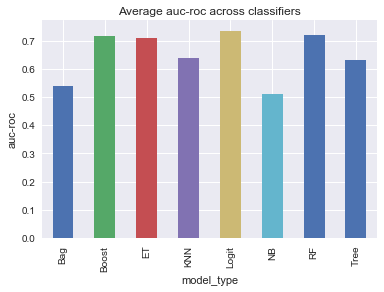

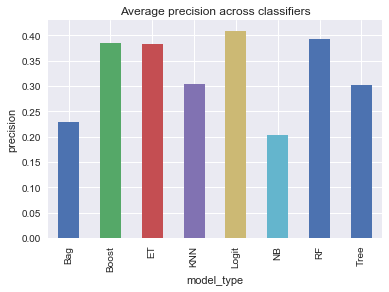

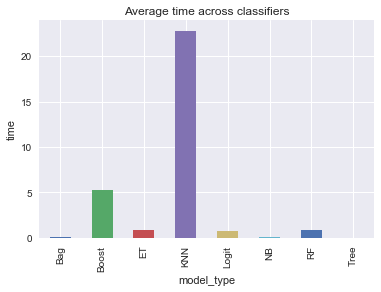

In [47]:
for item in ['auc-roc','precision','time']:
    plt.figure()
    results.groupby(['model_type'])[item].mean().plot(kind='bar', title='Average '+item+' across classifiers')
    plt.ylabel(item)

In [48]:
def best_grid(rdf, method = "auc-roc"):
    '''
    Iterate over the results and get the best parameters for each classifier
    and save the best_grid as a dictionary
    
    '''
    best = {}
    model = rdf.groupby("model_type")[method].nlargest(1)
    model = model.to_frame()
    model.reset_index(inplace = True)
    rows = list(model['level_1'])
    display(rdf.loc[rows].iloc[:,0:8])
    for row in rows:
        key = rdf.loc[row]["model_type"]
        v = rdf.loc[row]["parameters"]
        best[key] = v
    
    for k,arg in best.items():
        for key,val in arg.items():
            arg[key] = [val]

    return best

In [49]:
best = best_grid(results)

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20"
39,Bag,"{'max_features': 10, 'max_samples': 10, 'n_est...",0.6311,0.3018,0.1480,"(0.4011, 0.1001, 0.1603)","(0.3781, 0.1893, 0.2523)","(0.3205, 0.321, 0.3208)"
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.7449,0.4113,1.9873,"(0.511, 0.1276, 0.2042)","(0.463, 0.2318, 0.309)","(0.4562, 0.4568, 0.4565)"
91,ET,"{'criterion': 'gini', 'max_depth': 5, 'max_fea...",0.7491,0.4234,0.6015,"(0.5549, 0.1385, 0.2217)","(0.4767, 0.2387, 0.3181)","(0.4562, 0.4568, 0.4565)"
54,KNN,"{'algorithm': 'auto', 'n_neighbors': 50, 'weig...",0.6963,0.3696,31.0030,"(0.533, 0.1331, 0.213)","(0.4466, 0.2236, 0.298)","(0.4, 0.4005, 0.4003)"
44,Logit,"{'C': 0.1, 'penalty': 'l1'}",0.7458,0.4159,0.8528,"(0.5165, 0.1289, 0.2064)","(0.4658, 0.2332, 0.3108)","(0.4589, 0.4595, 0.4592)"
120,NB,{},0.5106,0.2032,0.1027,"(1.0, 0.2497, 0.3996)","(1.0, 0.5007, 0.6673)","(0.9863, 0.9877, 0.987)"
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7476,0.4184,0.6685,"(0.5, 0.1248, 0.1998)","(0.4849, 0.2428, 0.3236)","(0.4411, 0.4417, 0.4414)"
66,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.6791,0.3587,0.0498,"(0.4615, 0.1152, 0.1844)","(0.4877, 0.2442, 0.3254)","(0.4096, 0.4102, 0.4099)"


In [50]:
best

{'Bag': {'max_features': [10], 'max_samples': [10], 'n_estimators': [50]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [100]},
 'ET': {'criterion': ['gini'],
  'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100],
  'n_jobs': [-1]},
 'KNN': {'algorithm': ['auto'], 'n_neighbors': [50], 'weights': ['uniform']},
 'Logit': {'C': [0.1], 'penalty': ['l1']},
 'NB': {},
 'RF': {'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100]},
 'Tree': {'criterion': ['gini'],
  'max_depth': [20],
  'max_features': ['log2'],
  'min_samples_split': [2]}}

In [51]:
def plot_mult(models, x_train, x_test, y_train, y_test, bestm):
    '''
    Run model with the best given params on x and y
    and print out all the best models' on the same graph
    '''
    colors = "bgrcmykw"
    color_index = 0

    fig, ax1 = plt.subplots()
    ax1.set_xlabel('percent of population')
    ax1.set_ylabel('precision', color='b')
    ax2 = ax1.twinx()
    ax2.set_ylabel('recall', color='r')
    for index, clf in enumerate([clfs[x] for x in models]):
        model_params = bestm[models[index]]
        for p in ParameterGrid(model_params):
            try:
                clf.set_params(**p)
                y_pred_probs = clf.fit(x_train, y_train).predict_proba(x_test)[:,1]
                
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_pred_probs)
                precision_curve = precision_curve[:-1]
                recall_curve = recall_curve[:-1]
                pct_above_per_thresh = []
                number_scored = len(y_pred_probs)
                for value in pr_thresholds:
                    num_above_thresh = len(y_pred_probs[y_pred_probs>=value])
                    pct_above_thresh = num_above_thresh / float(number_scored)
                    pct_above_per_thresh.append(pct_above_thresh)
                pct_above_per_thresh = np.array(pct_above_per_thresh)
                
                ax1.plot(pct_above_per_thresh, precision_curve, c=colors[color_index])
                ax2.plot(pct_above_per_thresh, recall_curve, c=colors[color_index])                
            except IndexError as e:
                print(e)
                continue
        color_index += 1
        if color_index >= 7:
            color_index = 0
    ax1.legend(models)
    plt.show()

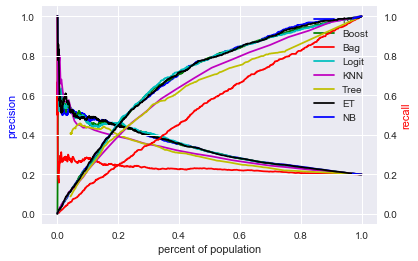

In [52]:
plot_mult(["RF", "Boost", "Bag", "Logit", "KNN", "Tree",  "ET", "NB"], x_train, x_test, y_train, y_test, best)

In [ ]:
##############################################################################################

In [57]:
##############Running classifiers to predict if the person re-enter within two years##########

In [53]:
results2 = clf_loop(["RF", "Boost", "Bag", "Logit", "KNN", "Tree", "ET", "NB"], x_train, x_test, y_train2, y_test2)

In [54]:
from IPython.display import display
display(results2.tail(10))

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
111,ET,"{'criterion': 'entropy', 'max_depth': 5, 'max_...",0.7323,0.4777,0.6208,"(0.5714, 0.1106, 0.1854)","(0.5753, 0.2234, 0.3218)","(0.5041, 0.3915, 0.4407)","(0.4721, 0.55, 0.5081)","(0.3923, 0.7617, 0.5179)"
112,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6659,0.4030,0.4490,"(0.5275, 0.1021, 0.1711)","(0.5342, 0.2074, 0.2989)","(0.4658, 0.3617, 0.4072)","(0.4311, 0.5021, 0.4639)","(0.3518, 0.683, 0.4644)"
113,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6708,0.4135,2.0573,"(0.5165, 0.1, 0.1676)","(0.5479, 0.2128, 0.3065)","(0.489, 0.3798, 0.4275)","(0.432, 0.5032, 0.4649)","(0.3518, 0.683, 0.4644)"
114,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.7037,0.4587,0.4695,"(0.6429, 0.1245, 0.2086)","(0.5753, 0.2234, 0.3218)","(0.4945, 0.384, 0.4323)","(0.4393, 0.5117, 0.4727)","(0.3704, 0.7191, 0.489)"
115,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.7145,0.4715,1.6429,"(0.6264, 0.1213, 0.2032)","(0.6027, 0.234, 0.3372)","(0.5151, 0.4, 0.4503)","(0.4484, 0.5223, 0.4826)","(0.377, 0.7319, 0.4976)"
116,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6655,0.4058,0.4586,"(0.5385, 0.1043, 0.1747)","(0.5452, 0.2117, 0.305)","(0.4699, 0.3649, 0.4108)","(0.4301, 0.5011, 0.4629)","(0.3468, 0.6734, 0.4579)"
117,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6723,0.4142,1.8562,"(0.5165, 0.1, 0.1676)","(0.5425, 0.2106, 0.3034)","(0.4822, 0.3745, 0.4216)","(0.4329, 0.5043, 0.4658)","(0.3529, 0.6851, 0.4658)"
118,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6940,0.4499,0.3619,"(0.5934, 0.1149, 0.1925)","(0.5644, 0.2191, 0.3157)","(0.4918, 0.3819, 0.4299)","(0.4402, 0.5128, 0.4737)","(0.3611, 0.7011, 0.4767)"
119,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.7132,0.4685,1.4301,"(0.6429, 0.1245, 0.2086)","(0.5726, 0.2223, 0.3203)","(0.511, 0.3968, 0.4467)","(0.4484, 0.5223, 0.4826)","(0.3715, 0.7213, 0.4904)"
120,NB,{},0.5108,0.2618,0.1005,"(1.0, 0.1936, 0.3244)","(1.0, 0.3883, 0.5594)","(1.0, 0.7766, 0.8743)","(0.8447, 0.984, 0.9091)","(0.5068, 0.984, 0.6691)"


In [55]:
best2 = best_grid(results2)

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20"
26,Bag,"{'max_features': 5, 'max_samples': 5, 'n_estim...",0.6191,0.3389,0.0564,"(0.4176, 0.0809, 0.1355)","(0.4082, 0.1585, 0.2284)","(0.389, 0.3021, 0.3401)"
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.7391,0.4860,1.8846,"(0.6044, 0.117, 0.1961)","(0.5644, 0.2191, 0.3157)","(0.5342, 0.4149, 0.4671)"
107,ET,"{'criterion': 'entropy', 'max_depth': 5, 'max_...",0.7439,0.4948,0.6231,"(0.5879, 0.1138, 0.1907)","(0.5836, 0.2266, 0.3264)","(0.5479, 0.4255, 0.479)"
54,KNN,"{'algorithm': 'auto', 'n_neighbors': 50, 'weig...",0.6921,0.4370,32.7337,"(0.6429, 0.1245, 0.2086)","(0.5205, 0.2021, 0.2912)","(0.489, 0.3798, 0.4275)"
44,Logit,"{'C': 0.1, 'penalty': 'l1'}",0.7394,0.4946,0.5933,"(0.6099, 0.1181, 0.1979)","(0.5562, 0.216, 0.3111)","(0.5438, 0.4223, 0.4754)"
120,NB,{},0.5108,0.2618,0.1005,"(1.0, 0.1936, 0.3244)","(1.0, 0.3883, 0.5594)","(1.0, 0.7766, 0.8743)"
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.7419,0.4925,0.6892,"(0.5879, 0.1138, 0.1907)","(0.5644, 0.2191, 0.3157)","(0.537, 0.417, 0.4695)"
77,Tree,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.7102,0.4521,0.0278,"(0.5824, 0.1128, 0.1889)","(0.5945, 0.2309, 0.3326)","(0.526, 0.4085, 0.4599)"


In [56]:
best2

{'Bag': {'max_features': [5], 'max_samples': [5], 'n_estimators': [20]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [100]},
 'ET': {'criterion': ['entropy'],
  'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100],
  'n_jobs': [-1]},
 'KNN': {'algorithm': ['auto'], 'n_neighbors': [50], 'weights': ['uniform']},
 'Logit': {'C': [0.1], 'penalty': ['l1']},
 'NB': {},
 'RF': {'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [2],
  'n_estimators': [100]},
 'Tree': {'criterion': ['entropy'],
  'max_depth': [10],
  'max_features': ['sqrt'],
  'min_samples_split': [5]}}

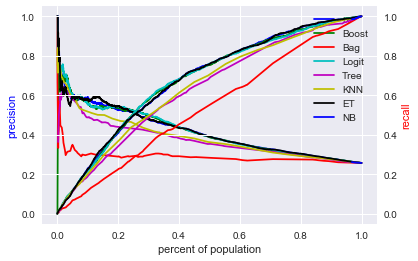

In [57]:
plot_mult(["RF", "Boost", "Bag", "Logit", "Tree", "KNN",  "ET", "NB"], x_train, x_test, y_train2, y_test2, best2)

In [58]:
def feature_importance(x_train, y_train, bestm, x="ET", k=10):
    clf = clfs[x]
    for p in ParameterGrid(bestm[x]):
        clf.set_params(**p)
    forest = clf.fit(x_train, y_train)
    
    importances = forest.feature_importances_
    current_palette = sns.color_palette(sns.color_palette("hls", 8))
    indices = np.argsort(importances)[::-1]
    indices = indices[:k]

    # Print the feature ranking
    print("Feature ranking for %s" % (y_train.name))

    labels_arr = []
    for f in range(len(indices)):
        label = indepv[indices[f]]
        labels_arr.append(label)
        print("%d. %s (%f)" % (f+1, label, importances[indices[f]]))

    # Plot the feature importances of the forest
    plt.figure()
    plt.title("Feature importances for %s" % (y_train.name))
    plt.bar(range(len(indices)), importances[indices], align="center", tick_label = labels_arr, color= current_palette)
    plt.xlim([-1, len(indices)])
    plt.xticks(range(len(indices)),labels_arr, rotation = 'vertical')
    plt.show()

Feature ranking for within_one
1. mh_treatment (0.352993)
2. bailed_out (0.130216)
3. bail_amt_binned0 (0.111223)
4. case_typeCR (0.058417)
5. bail_typeSUR (0.054328)
6. age_binned0 (0.044035)
7. case_typeJV (0.043018)
8. case_typeDV (0.027667)
9. bail_typePR (0.023660)
10. mar_statM (0.021341)
11. bail_typeCA (0.015293)
12. mar_statS (0.011642)
13. bail_typeORCD (0.008109)
14. age_binned2 (0.007388)
15. bail_typeGPS (0.006157)
16. raceWHITE (0.005456)
17. raceBLACK OR AFRICAN AMERICAN (0.004832)
18. arresting_agency_typeCITY (0.004804)
19. age_binned3 (0.004382)
20. arresting_agencyOLATHE P.D. (0.003562)
21. sexFEMALE (0.003205)
22. per_capita_income_binned0 (0.003094)
23. arresting_agencyKANSAS HIGHWAY PATROL (0.002998)
24. age_binned1 (0.002974)
25. arresting_agency_typeSTATE (0.002971)


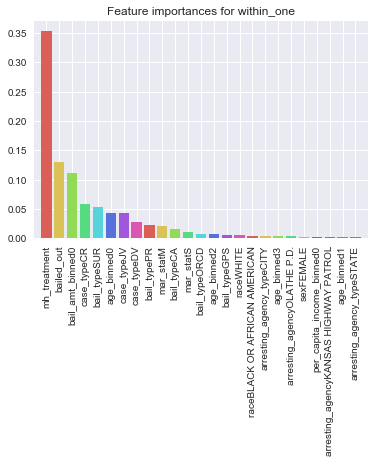

In [62]:
feature_importance(x_train, y_train, best, "ET", 20)

Feature ranking for within_two
1. mh_treatment (0.355064)
2. bailed_out (0.111706)
3. bail_amt_binned0 (0.089030)
4. bail_typeSUR (0.080080)
5. case_typeCR (0.048160)
6. mar_statM (0.039955)
7. bail_typePR (0.039270)
8. age_binned0 (0.032555)
9. case_typeJV (0.030671)
10. case_typeDV (0.027116)
11. bail_typeGPS (0.011534)
12. bail_typeCA (0.009998)
13. mar_statS (0.009850)
14. arresting_agency_typeSTATE (0.008433)
15. age_binned3 (0.008171)
16. age_binned2 (0.007955)
17. arresting_agency_typeCOUNTY SHERIFF (0.006498)
18. arresting_agencyOLATHE P.D. (0.005857)
19. raceWHITE (0.004902)
20. arresting_agency_typeCITY (0.004781)


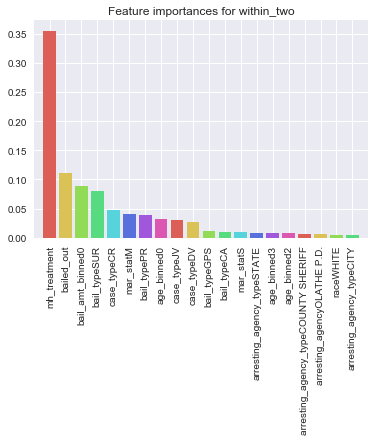

In [63]:
feature_importance(x_train, y_train2, best2, "ET", 20)

In [64]:
#Printing out the best decision tree
def print_tree(x_train, y_train, bestm):
    clf = clfs["Tree"]
    for p in ParameterGrid(bestm["Tree"]):
        clf.set_params(**p)
        tree = clf.fit(x_train, y_train)
        tree_viz = export_graphviz(tree, out_file=None, feature_names=indepv, rounded=True, filled=True)
        graph =graphviz.Source(tree_viz)
            
    return graph

In [65]:
print_tree(x_train, y_train, best)

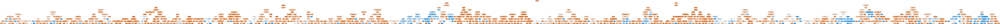

In [66]:
print_tree(x_train, y_train2, best2)

In [1]:
best ={'Bag': {'max_features': [5], 'max_samples': [10], 'n_estimators': [50]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [100]},
 'ET': {'criterion': ['gini'],
  'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [2],
  'n_estimators': [100],
  'n_jobs': [-1]},
 'KNN': {'algorithm': ['auto'], 'n_neighbors': [50], 'weights': ['uniform']},
 'Logit': {'C': [0.1], 'penalty': ['l1']},
 'NB': {},
 'RF': {'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100]},
 'Tree': {'criterion': ['gini'],
  'max_depth': [10],
  'max_features': ['sqrt'],
  'min_samples_split': [2]}}

In [84]:
best2={'Bag': {'max_features': [10], 'max_samples': [5], 'n_estimators': [50]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [100]},
 'ET': {'criterion': ['gini'],
  'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100],
  'n_jobs': [-1]},
 'KNN': {'algorithm': ['auto'], 'n_neighbors': [50], 'weights': ['uniform']},
 'Logit': {'C': [0.1], 'penalty': ['l2']},
 'NB': {},
 'RF': {'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100]},
 'Tree': {'criterion': ['entropy'],
  'max_depth': [5],
  'max_features': ['sqrt'],
  'min_samples_split': [2]}}